In [1]:
import os, sys, glob
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

%config InlineBackend.figure_format = 'retina'
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
ROOT_PATH = '..'

In [53]:
def color(index, alpha=1):
    color_list = ['#0c6575', '#bbcbcb', '#23a98c', '#fc7a70', '#a07060', '#003847', '#FFF7D6', '#5CA4B5', '#eeeeee']
    return color_list[index % len(color_list)] + hex(int(255 * alpha))[2:]

,0,2,1,4,3
diagnosis,1805,999,370,295,193


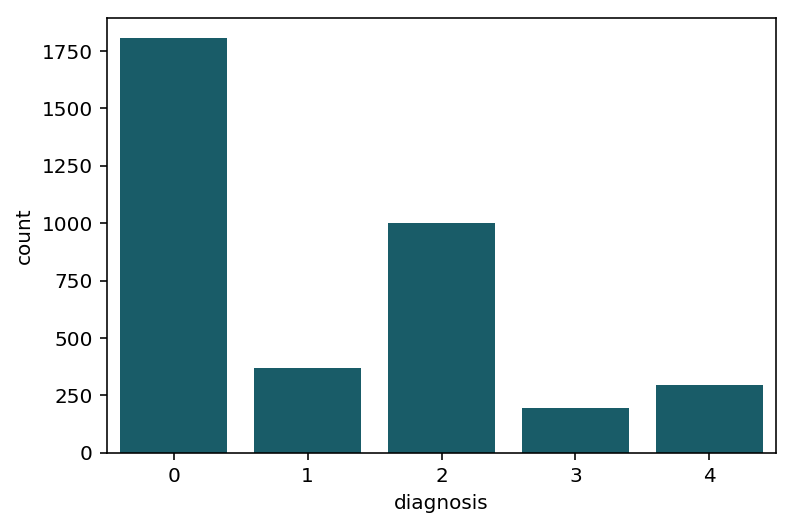

In [74]:
df = pd.read_csv(f'{ROOT_PATH}/data/train.csv')

import seaborn as sns
sns.countplot(df['diagnosis'], color=color(0))
df.diagnosis.value_counts().to_frame().T

## Loading dataset with PIL

In [75]:
from PIL import Image

train_images_path = glob.glob(f'{ROOT_PATH}/data/train_images/*.png')
train_resolution_array = np.zeros([2, len(train_images_path)])
for image_index, image_path in enumerate(train_images_path):
    im = Image.open(image_path)
    train_resolution_array[0, image_index] = im.size[0]
    train_resolution_array[1, image_index] = im.size[1]
    
test_images_path = glob.glob(f'{ROOT_PATH}/data/test_images/*.png')
test_resolution_array = np.zeros([2, len(test_images_path)])
for image_index, image_path in enumerate(test_images_path):
    im = Image.open(image_path)
    test_resolution_array[0, image_index] = im.size[0]
    test_resolution_array[1, image_index] = im.size[1]

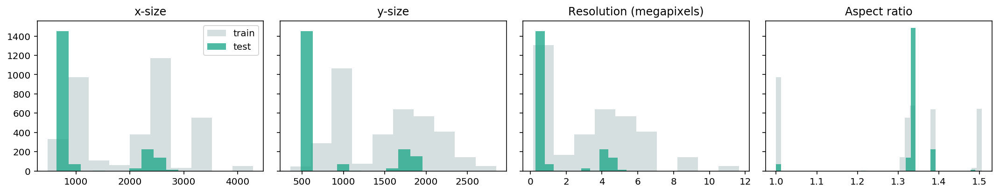

In [76]:
fix, (ax_x, ax_y, ax_res, ax_ar) = plt.subplots(1, 4, figsize=(15,3), sharey=True)
color_train, color_test = color(1, alpha=0.6), color(2, alpha=0.8)

ax_x.hist(train_resolution_array[0, :], color=color_train, label='train')
ax_x.hist(test_resolution_array[0, :], color=color_test, label='test')
ax_x.set(**{'title':'x-size'})
ax_x.legend()

ax_y.hist(train_resolution_array[1, :], color=color_train)
ax_y.hist(test_resolution_array[1, :], color=color_test)
ax_y.set(**{'title':'y-size'})

pixel_to_megapixel = 1/1024**2
ax_res.hist(train_resolution_array[0, :]*train_resolution_array[1, :]*pixel_to_megapixel, color=color_train)
ax_res.hist(test_resolution_array[0, :]*test_resolution_array[1, :]*pixel_to_megapixel, color=color_test)
ax_res.set(**{'title':'Resolution (megapixels)'})


ax_ar.hist(train_resolution_array[0, :]/train_resolution_array[1, :], bins=40, color=color_train)
ax_ar.hist(test_resolution_array[0, :]/test_resolution_array[1, :], bins=40, color=color_test)
ax_ar.set(**{'title':'Aspect ratio'})

plt.tight_layout()

### Let's plot some images

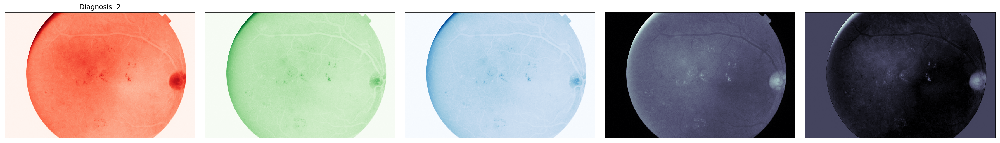

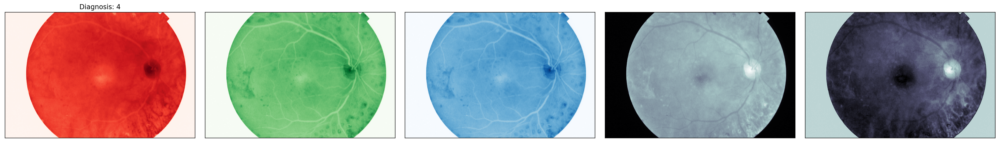

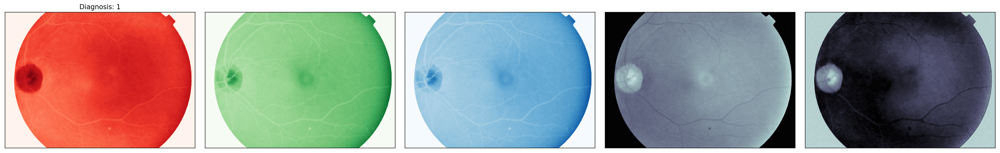

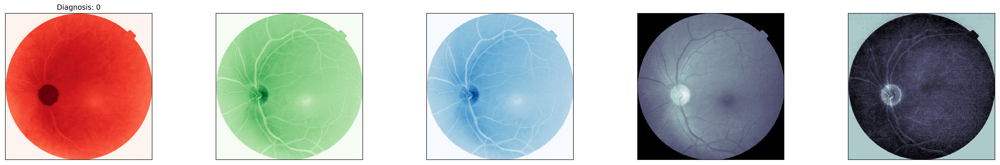

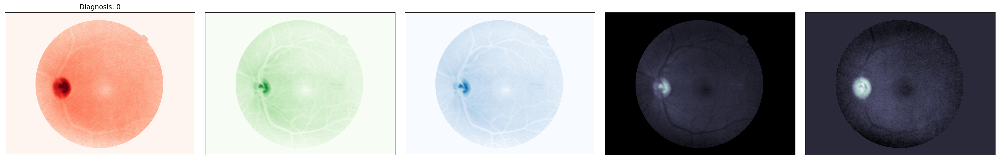

In [8]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

for image_index in range(5):
    image_path = f'{ROOT_PATH}/data/train_images/{df.id_code[image_index]}.png'
    img = load_img(image_path)
    img_array = img_to_array(img)
    img_array.shape
    
    img_array = img_array - img_array.mean(axis=(0,1))
    
    fig, (ax_r, ax_g, ax_b, ax_mean, ax_prod) = plt.subplots(1, 5, figsize=(25, 4))
    ax_r.imshow(img_array[..., 0], cmap='Reds')
    ax_g.imshow(img_array[..., 1], cmap='Greens')
    ax_b.imshow(img_array[..., 1], cmap='Blues')
    ax_mean.imshow(np.mean(img_array,2), cmap='bone')
    ax_prod.imshow(np.std(img_array,2), cmap='bone')

    ax_r.set_title(f'Diagnosis: {df.diagnosis[image_index]}')

    for ax in (ax_r, ax_g, ax_b, ax_mean, ax_prod):
        ax.set(**{'xticks':[], 'yticks':[]})
    plt.tight_layout()
    plt.show()

### What's the pixel intensity distribution?

In [9]:
bins = np.linspace(-2, 4, 100)
hist = np.zeros(99)

for image_index in tqdm(range(100)):
    image_path = f'{ROOT_PATH}/data/train_images/{df.id_code[image_index]}.png'
    img = load_img(image_path)
    img_array = img_to_array(img)
    img_mean = img_array.mean(2)
    img_norm = img_mean - np.mean(img_mean)
    img_norm = img_norm/np.std(img_norm)
    hist = hist + np.histogram(img_norm, bins=bins)[0]

# h = plt.hist(img_norm.flatten(), bins=100)

100%|██████████| 100/100 [00:37<00:00,  2.94it/s]


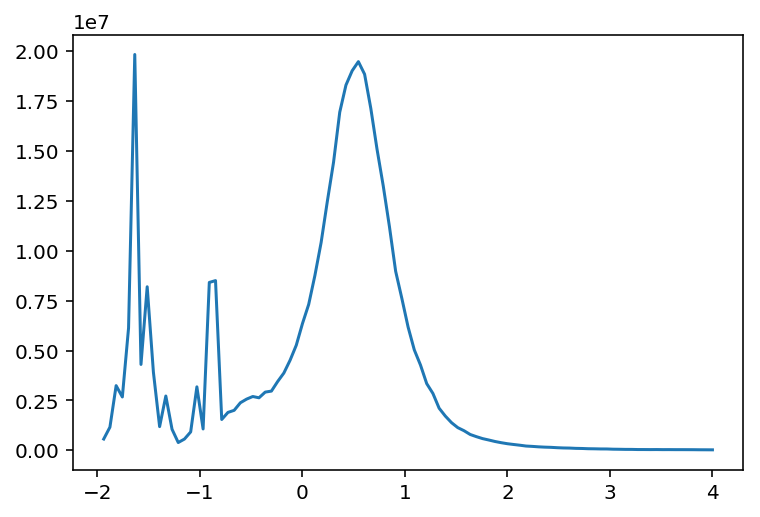

In [18]:
plt.plot(bins[1:], hist)

### Open CV

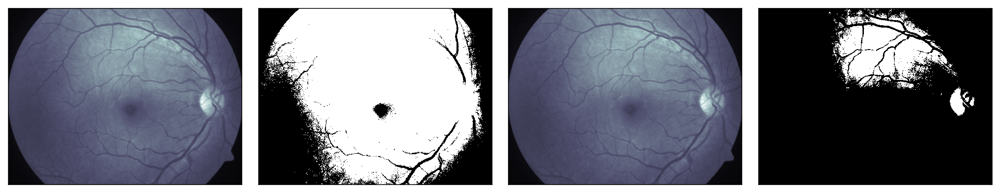

In [21]:
import cv2

image_index = 6
image_path = f'{ROOT_PATH}/data/train_images/{df.id_code[image_index]}.png'
img = cv2.imread(image_path)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15,4))
cmap = 'bone'

img = img.mean(2)
img = img - np.mean(img)
img = img/np.std(img)
ax1.imshow(img, cmap=cmap)

inside_region  = img > -0.3
ax2.imshow(inside_region, cmap=cmap)

img = img - np.mean(img[inside_region])
img = img / np.std(img[inside_region])
ax3.imshow(img, cmap=cmap)

binary_features = img > 1
ax4.imshow(binary_features, cmap=cmap)

for ax in [ax1, ax2, ax3, ax4]:
    ax.set(**{'xticks':[], 'yticks':[]})
plt.tight_layout()

In [23]:
moments = cv2.moments(binary_features.astype(float))
hu_moments_list = cv2.HuMoments(moments).flatten().tolist()
moments_count = len(moments)
hu_moments_count = len(hu_moments_list)
print(moments_count, hu_moments_count)

24 7


In [230]:
def get_binary_image(img, inside_thresh=-0.3, feature_thresh=1):
    img = img.mean(2)
    img = img - np.mean(img)
    img = img/np.std(img)
    inside_region  = img > inside_thresh
    img = img - np.mean(img[inside_region])
    img = img / np.std(img[inside_region])
    binary_features = img > feature_thresh
    return binary_features

def get_momentums(binary_features):
    moments = cv2.moments(binary_features.astype(float))
    hu_moments_list = cv2.HuMoments(moments).flatten().tolist()
    moments_list = [moments[key] for key in sorted(moments.keys())]
    return moments_list + hu_moments_list
    

In [240]:
df = pd.read_csv(f'{ROOT_PATH}/data/train.csv')
for moment_index in range(moments_count+hu_moments_count):
    df[f'x_{moment_index:02d}'] = np.nan
    
for index, row in tqdm(df.iterrows()):
    image_path = f'{ROOT_PATH}/data/train_images/{row.id_code}.png'
    binary_features = get_binary_image(cv2.imread(image_path))
    momentums = get_momentums(binary_features)
    for momentum_index, momentum in enumerate(momentums):
        df.loc[index, f'x_{momentum_index:02d}'] = momentum    

3662it [23:03,  2.32it/s]


In [242]:
# df.to_csv('train_momentum.csv')

In [248]:
df_test = pd.read_csv(f'{ROOT_PATH}/data/test.csv')
for moment_index in range(moments_count+hu_moments_count):
    df_test[f'x_{moment_index:02d}'] = np.nan
    
for index, row in tqdm(df_test.iterrows()):
    image_path = f'{ROOT_PATH}/data/test_images/{row.id_code}.png'
    binary_features = get_binary_image(cv2.imread(image_path))
    momentums = get_momentums(binary_features)
    for momentum_index, momentum in enumerate(momentums):
        df_test.loc[index, f'x_{momentum_index:02d}'] = momentum   

1928it [04:26,  7.23it/s]


In [250]:
# df_test.to_csv('test_momentum.csv')